<a href="https://colab.research.google.com/github/Ankur-singh/GANs/blob/main/notebooks/02_DCGANs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In the last notebook, we trained a basic GAN to generate MNIST digits. In this notebook, we will update the Generator as well as the Discriminator network to use CNN layers.

DCGANs paper also does a lot of small tweaks to help train the model. I will try my best to highlight all the tweaks from the paper but its highly recommended that you go through the [original paper](https://arxiv.org/pdf/1511.06434.pdf) to better understand the motivation behind those tweaks.

In [1]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [63]:
import torch
import torchvision
from torch import nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torch.utils.tensorboard import SummaryWriter

import matplotlib.pyplot as plt
%matplotlib inline

In [42]:
## Config

BS = 128
LR = 1e-4
NOISE_DIM = 100
IMAGE_SIZE = (32, 32)
NUM_CHANNELS = 1
NUM_EPOCHS = 15
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
DEVICE

'cuda'

Here, we will use MNIST data.

In [43]:
## Data 
tfms = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.ToTensor(), 
    transforms.Normalize((0.5, ), (0.5, ))
])
dataset = datasets.MNIST(root='data/', download=True, transform=tfms)
dataloader = DataLoader(dataset, shuffle=True, batch_size=BS)

In [44]:
## Models

class Generator(nn.Module):
    def __init__(self, in_dim, out_dim):
        super().__init__()
        self.model = nn.Sequential(
            nn.ConvTranspose2d(in_dim, 512, 4, 1, 0, bias=False), # 4 x 4
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),    # 8 x 8
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),    # 16 x 16
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, out_dim, 4, 2, 1),            # 32 x 32
            nn.Tanh()
        )

    def forward(self, x):
        return self.model(x)


class Discriminator(nn.Module):
    def __init__(self, in_dim, out_dim=1):
        super().__init__()
        self.model = nn.Sequential(
            nn.Conv2d(in_dim, 128, 4, 2, 1, bias=False),  # 16 x 16
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.01),
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),     # 8 x 8
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.01),
            nn.Conv2d(256, 512, 4, 2, 1, bias=False),     # 4 x 4
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.01),
            nn.Flatten(),
            nn.Linear(512*4*4, out_dim),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.model(x)


def initialize_weights(model):
    # Initializes weights according to the DCGAN paper
    for m in model.modules():
        if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.BatchNorm2d)):
            nn.init.normal_(m.weight.data, 0.0, 0.02)


netG = Generator(NOISE_DIM, NUM_CHANNELS).to(DEVICE)
netD = Discriminator(NUM_CHANNELS).to(DEVICE)
initialize_weights(netG)
initialize_weights(netD)
fixed_noise = torch.randn(BS, NOISE_DIM).to(DEVICE)

In [45]:
fixed_noise.shape

torch.Size([128, 100])

In [46]:
netD(netG(fixed_noise.view(-1, 100, 1, 1))).shape

torch.Size([128, 1])

As you can see, the Generator and the Discriminator model are very easily to implement. They are just Convolution and Deconvolution layers. Here are some Architecture guidelines, from the original paper, for stable Deep Convolutional GANs:
- Replace any pooling layers with strided convolutions (discriminator) and fractional-strided convolutions (generator).
- Use `batchnorm` in both the generator and the discriminator.
- Remove fully connected hidden layers for deeper architectures.
- Use `ReLU` activation in generator for all layers except for the output, which uses `Tanh`.
- Use `LeakyReLU` activation in the discriminator for all layers.

We also initialized the models according to the paper i.e mean 0 and std 0.02.

Note: The Generator and the Discriminator code could be refactored to support different size of input images (not just 32x32) but for the sake of understanding, I have used the simplest possible approach.

In [47]:
## Loss & Optimizer
loss = nn.BCELoss()

opt_gen = torch.optim.Adam(netG.parameters(), lr=LR, betas=(0.5, 0.999))
opt_dis = torch.optim.Adam(netD.parameters(), lr=LR, betas=(0.5, 0.999))

In [49]:
## TensorBoard : starting it before training to monitor it in progress
%tensorboard --logdir logs

Reusing TensorBoard on port 6006 (pid 141), started 0:31:56 ago. (Use '!kill 141' to kill it.)

<IPython.core.display.Javascript object>

In this notebook, we are using exactly the same training loop from the last notebook. I just removed the reshape method i.e. `.view()`.

AI am training this model on GPU as it requires more compute and would take a lot of time on CPU.

In [50]:
## Training

step = 0
writer_fake = SummaryWriter(f"logs/fake")
writer_real = SummaryWriter(f"logs/real")

for epoch in range(NUM_EPOCHS):
    for i, (xb, yb) in enumerate(dataloader):
        noise = torch.randn(64, 100, 1, 1).to(DEVICE)
        fake = netG(noise)
        real = xb.to(DEVICE)
        
        # Discriminator
        dis_fake = netD(fake.detach()) # important
        dis_real = netD(real)

        loss_fake = loss(dis_fake, torch.zeros_like(dis_fake))
        loss_real = loss(dis_real, torch.ones_like(dis_real))
        loss_dis = loss_fake + loss_real
        opt_dis.zero_grad()
        loss_dis.backward()
        opt_dis.step()

        # Generator
        dis_fake = netD(fake)
        loss_gen = loss(dis_fake, torch.ones_like(dis_fake))
        opt_gen.zero_grad()
        loss_gen.backward()
        opt_gen.step()

        if i == 0:
            print(
                f"Epoch [{epoch}/{NUM_EPOCHS}] Batch {i}/{len(dataloader)} \
                    Loss D: {loss_dis:.4f}, loss G: {loss_gen:.4f}"
            )

            with torch.no_grad():
                fake = netG(noise)
                data = real
                img_grid_fake = torchvision.utils.make_grid(fake, normalize=True)
                img_grid_real = torchvision.utils.make_grid(data, normalize=True)

                writer_fake.add_image(
                    "Mnist Fake Images", img_grid_fake, global_step=step
                )
                writer_real.add_image(
                    "Mnist Real Images", img_grid_real, global_step=step
                )
                step += 1


Epoch [0/15] Batch 0/469                     Loss D: 1.3420, loss G: 1.3551
Epoch [1/15] Batch 0/469                     Loss D: 0.0002, loss G: 9.3670
Epoch [2/15] Batch 0/469                     Loss D: 0.0001, loss G: 9.4143
Epoch [3/15] Batch 0/469                     Loss D: 100.0000, loss G: 0.0000
Epoch [4/15] Batch 0/469                     Loss D: 100.0000, loss G: 0.0000
Epoch [5/15] Batch 0/469                     Loss D: 100.0000, loss G: 0.0000
Epoch [6/15] Batch 0/469                     Loss D: 100.0000, loss G: 0.0000
Epoch [7/15] Batch 0/469                     Loss D: 100.0000, loss G: 0.0000
Epoch [8/15] Batch 0/469                     Loss D: 100.0000, loss G: 0.0000
Epoch [9/15] Batch 0/469                     Loss D: 100.0000, loss G: 0.0000
Epoch [10/15] Batch 0/469                     Loss D: 0.4128, loss G: 4.4432
Epoch [11/15] Batch 0/469                     Loss D: 0.2651, loss G: 2.1617
Epoch [12/15] Batch 0/469                     Loss D: 0.0988, loss G: 4.

That is it, we just implemented DCGANs. If you check the tensorboard, you will see that its able to generate very pausible images of digits. Here are a few examples:

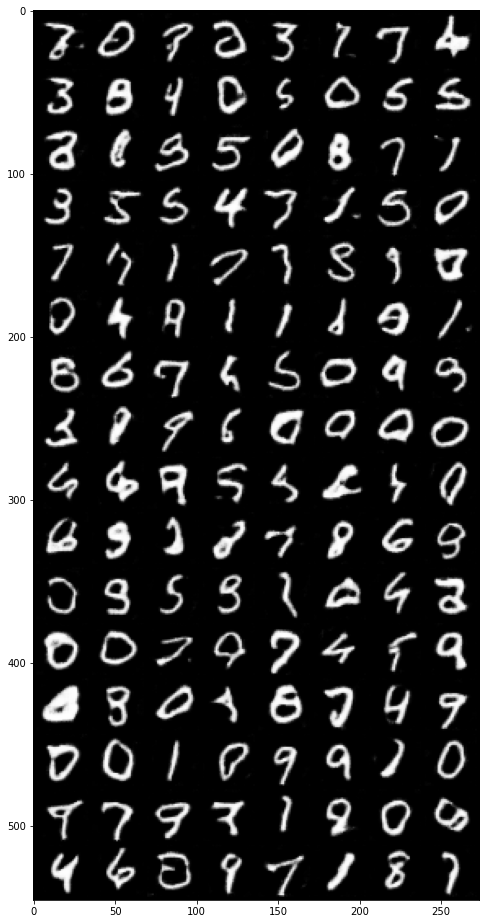

In [62]:
fake = netG(fixed_noise.view(-1, 100, 1, 1))
img_grid_fake = torchvision.utils.make_grid(fake, normalize=True)

plt.figure(figsize=(8, 24))
plt.imshow(img_grid_fake.cpu().permute(1, 2, 0).numpy());

### What Next?

As you can see, the Generator loss and the Discriminator loss are all over the place. Sometimes, Discriminator loss is very high and the generator loss is zero; and at other times, its quite the opposite. This is what happens when we try to train two different agents with opposite loss functions. Its no surprise why people say its very hard to train GANs.

Here are a few observations:
- from epoch 3 to 9, the Generator model learns to generate images of 7. For any input noise, it was generating the same image of 7. This problem is know is Mode Collapse.
- The are multiple correct answers, as Discriminator learns one solution, the Generator moves to another solution. We don't want our Generator to keep jumping from one solution. Ideally, we want it to understand that there are multiple solutions and it can select any one. Here, in the example above, the Generator can choose to generate any digit.

In the next couple of notebooks, we will discuss both these problems in detail and also discuss the possible solutions. But before we discuss these problems, we will see how to make the training more stable.